# Import Libraries

In [1]:
# standard libraries
import numpy as np
import pandas as pd
import random
from IPython.display import Audio
import matplotlib.pyplot as plt
import seaborn as sns
import time
import os
from joblib import Parallel, delayed
from tqdm import tqdm
import librosa
from sklearn.model_selection import train_test_split
# for normalization & avgpooling features
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf

2024-06-04 03:33:03.334581: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-04 03:33:03.334702: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-04 03:33:03.473499: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [1]:
import psutil

def get_memory_info():
    mem = psutil.virtual_memory()
    total = mem.total / (1024 ** 3)
    available = mem.available / (1024 ** 3)
    print(f"Total memory: {total:.2f} GB")
    print(f"Available memory: {available:.2f} GB")

get_memory_info()

Total memory: 31.36 GB
Available memory: 30.09 GB


In [ ]:
# import shutil
# source_dir = '/kaggle/working/extracted'
# output_zip_file = '/kaggle/working/zipfile'
# shutil.make_archive(output_zip_file, 'zip', source_dir)

# from IPython.display import FileLink
# FileLink("/kaggle/working/zipfile.zip")

# Load train_metadata.csv

In [2]:
# change the file path to your local path
df = pd.read_csv('/kaggle/input/birdclef-2024/train_metadata.csv')

len(df)
# df.head()

24459

In [36]:
# len(filtered_df)/len(df)

0.08732981724518582

# Preprocessing

## 1. include only the 3 species selected (barswa, comsan, and eaywag1)

In [3]:
# interested_species = ['ashdro1', 'brodro1', 'commoo3', 'greegr', 'heswoo1']
# interested_species = ['ashdro1', 'brodro1', 'commoo3']
interested_species = ['grewar3', 'asikoe2', 'commyn', 'rorpar', 'woosan', 'grnsan'] #'blrwar1', 

In [4]:
# filtered_df = df
filtered_df = df[df['primary_label'].isin(interested_species)]

# filtered_df.head(20)

In [5]:
filtered_df['primary_label'].value_counts()

primary_label
grnsan     500
grewar3    500
woosan     500
rorpar     420
asikoe2    275
commyn     237
Name: count, dtype: int64

## Remove non-existing audio data entries

In [6]:
def remove_nonexistent_files(df, column_name, directory):
    def file_exists(filename):
        return os.path.isfile(os.path.join(directory, filename))
    file_existence_mask = df[column_name].apply(file_exists)
    df_filtered = df[file_existence_mask].copy()
    return df_filtered

In [7]:
column_name = "filename"
directory = "/kaggle/input/birdclef-2024/train_audio"
filtered_df = remove_nonexistent_files(filtered_df, column_name, directory)

## 2. remove duplicates (same 'duration', 'location', 'type', 'primary_label', 'author')

### Step 1. Extract duration using librosa

In [8]:
# change the file path to your local path
path = '/kaggle/input/birdclef-2024/train_audio/'
sr = 16000

In [9]:
# example = filtered_df[filtered_df['rating']==2.5]['filename'].iloc[1]
example = filtered_df['filename'].iloc[0]
# example

In [10]:
audio, _ = librosa.load(path + example, sr=sr)
Audio(audio, rate=sr)

In [10]:
def get_audio_duration(file_path, sr=sr):
  audio, _ = librosa.load(file_path, sr=sr)
  duration = librosa.get_duration(y=audio, sr=sr)
  return duration

In [11]:
%%time

filtered_df.loc[:, 'duration'] = filtered_df['filename'].apply(lambda x: get_audio_duration(path + x))

CPU times: user 2min 16s, sys: 5.12 s, total: 2min 22s
Wall time: 2min 42s


In [ ]:
# filtered_df['duration'].dtypes

In [ ]:
# filtered_df.head()

### Step 2. Find duplicates

same 'duration', 'location', 'type', 'primary_label', 'author'

In [12]:
duplicates = filtered_df.duplicated(subset=['duration', 'longitude', 'latitude', 'type', 'primary_label', 'author'], keep=False)
duplicated_rows = filtered_df[duplicates]

display(len(duplicated_rows))
# display(duplicated_rows)

10

In [14]:
dup1, _ = librosa.load(path + duplicated_rows['filename'].iloc[0], sr=sr)
Audio(dup1, rate=sr)

In [53]:
dup2, _ = librosa.load(path + duplicated_rows['filename'].iloc[1], sr=sr)
Audio(dup2, rate=sr)

### Step 3. Remove duplicates

In [13]:
display(len(filtered_df))
filtered_df = filtered_df.drop_duplicates(subset=['duration', 'latitude', 'type', 'primary_label', 'author'], keep='first')
display(len(filtered_df))

2432

2426

## Shuffle df 

In [14]:
filtered_df = filtered_df.sample(frac=1).reset_index(drop=True)

## filter desired durations 

In [15]:
print(prev_len:= len(filtered_df))
filtered_df_ = filtered_df[filtered_df['duration']<=245]
# filtered_df = filtered_df[(filtered_df['duration']>=2.5)&(filtered_df['duration']<=490)] #122.5
print(len(filtered_df_))
print(len(filtered_df_)/prev_len)
print(filtered_df_['duration'].sum()/filtered_df['duration'].sum())

2426
2380
0.9810387469084914
0.6938964485998255


## Add rating_category column for binary rating

In [16]:
# Assign value to a new column based on the rating column
print(prev_len:= len(filtered_df))
filtered_df['rating_category'] = filtered_df['rating'].apply(lambda x: 'good' if x >= 3.0 else 'bad')
filtered_df = filtered_df[filtered_df['rating_category']=='good']
print(len(filtered_df))
print(len(filtered_df)/prev_len)

2426
2136
0.8804616652926628


## Show distribution of categories in primary_label 

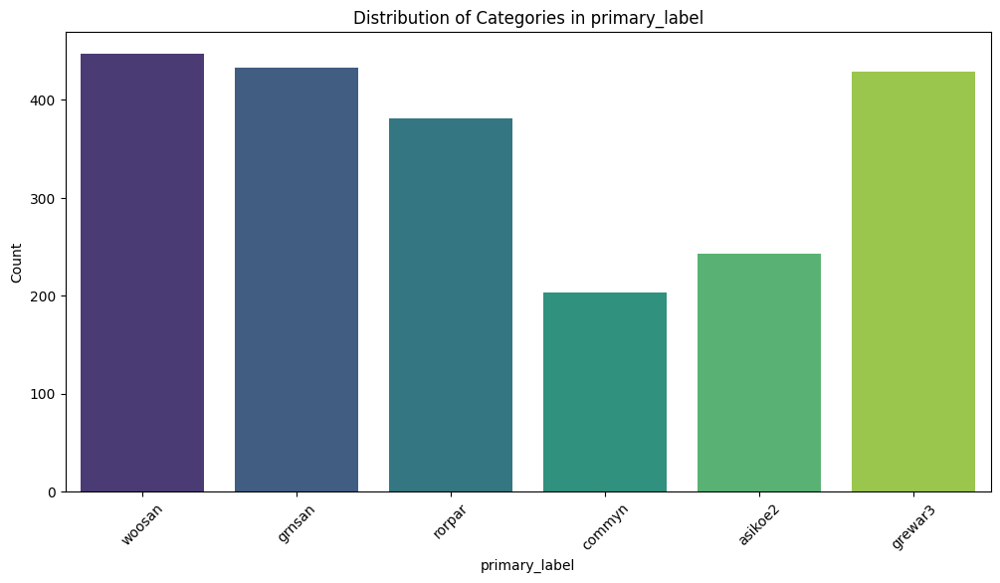

In [17]:
# Function to plot the distribution of categories in a specific column
def plot_category_distribution(dataframe, column):
    plt.figure(figsize=(12, 6))

    # Plot bar plot
    sns.countplot(data=dataframe, x=column, palette='viridis')
    plt.title(f'Distribution of Categories in {column}')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()
plot_category_distribution(filtered_df, 'primary_label')

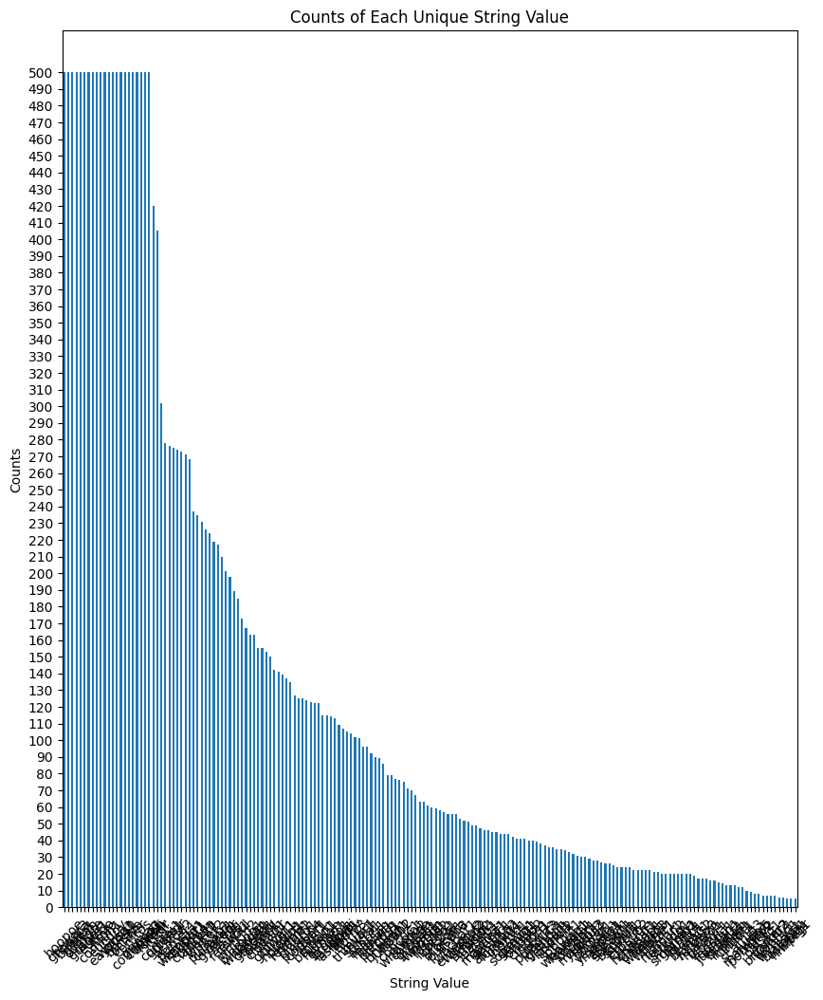

In [18]:
def plot_count(df,column):
    # Count occurrences of each unique string in the column
    f_df_cnts = df['primary_label'].value_counts()

    # Plotting
    plt.figure(figsize=(10, 12))
    f_df_cnts.plot(kind='bar')
    plt.xlabel('String Value')
    plt.ylabel('Counts')
    plt.title('Counts of Each Unique String Value')
    plt.xticks(rotation=45)

    y_max = f_df_cnts.max()
    y_ticks = range(0, y_max + 1, 10)  # Adjust the step as needed
    plt.yticks(y_ticks)
    plt.show()

plot_count(df, 'primary_label')

## Show distribution of durations

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


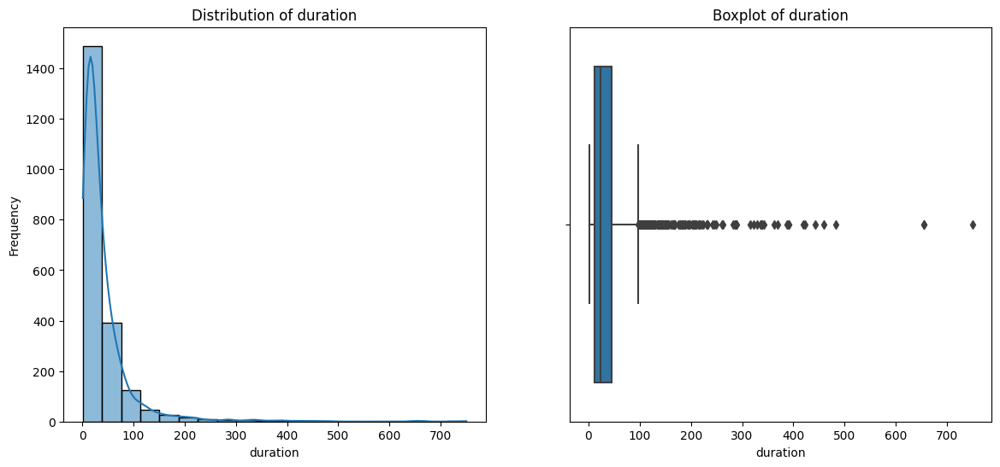

In [19]:
# Plot the distribution of values in 'target_column'
def plot_distribution(dataframe, column):
    plt.figure(figsize=(14, 6))

    # Plot histogram
    plt.subplot(1, 2, 1)
    sns.histplot(dataframe[column], kde=True, bins=20)
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')

    # Plot boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(x=dataframe[column])
    plt.title(f'Boxplot of {column}')

    plt.show()

# Plotting the distribution of 'target_column'
plot_distribution(filtered_df[filtered_df['duration']<1000], 'duration')

## Show distribution of total duration by species

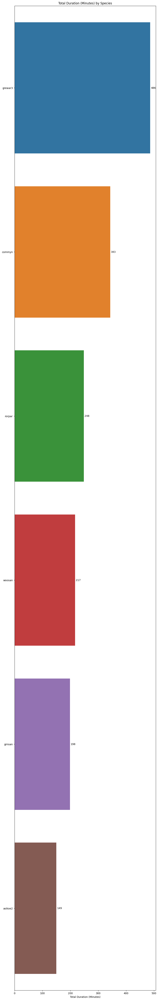

In [20]:
def plot_duration_per_specie(df, width, hieght):
    duration_sum = df[['primary_label', 'duration']].groupby(['primary_label']).sum('duration').reset_index().sort_values('duration', ascending=False)
    duration_sum['duration_mins'] = duration_sum['duration'] / 60

    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(width,hieght))

    sns.barplot(x='duration_mins', y='primary_label', data=duration_sum, ax=axes)
    axes.bar_label(axes.containers[0], fmt='%i', padding=3)
    axes.set(xlim=[0, np.max(duration_sum['duration_mins']) + 20])
    axes.set(ylabel='')
    axes.set(xlabel='Total Duration (Minutes)')
    axes.set(title='Total Duration (Minutes) by Species')

    plt.show()

plot_duration_per_specie(filtered_df, 10, 70)

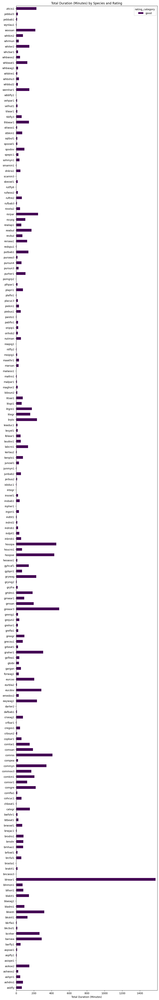

In [284]:
# Grouping and calculating the duration sum
duration_sum = (
    filtered_df[['primary_label', 'duration', 'rating_category']]
    .groupby(['primary_label', 'rating_category'])
    .sum('duration')
    .reset_index()
    .sort_values('duration', ascending=False)
)

# Adding a column for duration in minutes
duration_sum['duration_mins'] = duration_sum['duration'] / 60

# Pivot the data to prepare for stacked bar plot
pivot_df = duration_sum.pivot_table(
    index='primary_label', 
    columns='rating_category', 
    values='duration_mins', 
    fill_value=0
)

# Plotting
fig, ax = plt.subplots(figsize=(10, 70))

# Stacked bar plot
pivot_df.plot(kind='barh', stacked=True, ax=ax, colormap='viridis')

# # Adding labels to each bar section
# for container in ax.containers:
#     ax.bar_label(container, fmt='%.1f', padding=3)

# Setting labels and title
ax.set_xlim([0, np.max(pivot_df.sum(axis=1)) + 20])
ax.set_ylabel('')
ax.set_xlabel('Total Duration (Minutes)')
ax.set_title('Total Duration (Minutes) by Species and Rating')

# Display the plot
plt.show()

## 3. Stratify and split filtered_df to train and test

In [21]:
def birds_stratified_split(df, target_col, test_size=0.2):
    class_counts = df[target_col].value_counts()
    low_count_classes = class_counts[class_counts < 2].index.tolist() ### Birds with single counts

    df['train'] = df[target_col].isin(low_count_classes)

    train_df, test_df = train_test_split(df[~df['train']], test_size=test_size, stratify=df[~df['train']][target_col], random_state=42)

    train_df = pd.concat([train_df, df[df['train']]], axis=0).reset_index(drop=True)

    # Remove the 'valid' column
    train_df.drop('train', axis=1, inplace=True)
    test_df.drop('train', axis=1, inplace=True)

    return train_df, test_df

In [22]:
train_df, test_df = birds_stratified_split(filtered_df, 'primary_label', 0.3)

In [23]:
display(len(train_df))
# display(train_df.head())

1495

In [24]:
display(len(test_df))
# display(test_df.head())

641

## Save the train_df and test_df for future use

In [21]:
preprocessed_dir = "/kaggle/working/preprocessed/"
os.makedirs(preprocessed_dir, exist_ok=True)
train_df.to_csv(preprocessed_dir + 'train_df.csv', index=False)
test_df.to_csv(preprocessed_dir + 'test_df.csv', index=False)

# **Feature Extraction**

## Note! extremely short audio files failed to make it to the stage of np arry extraction 

In [ ]:
# path = '/kaggle/input/birdclef-2024/train_audio/greegr/XC338469.ogg'
# path = '/kaggle/input/birdclef-2024/train_audio/commoo3/XC739282.ogg'
# path = '/kaggle/input/birdclef-2024/train_audio/brodro1/XC577845.ogg'
# audio_example, _ = librosa.load(path, sr=16000)
# audio_example.shape
audio_example = np.load('/kaggle/input/extracted-npy/extracted/test_npy/commoo3/XC185242.npy')
Audio(audio_example, rate=16000)

In [ ]:
# save_filename = f'/kaggle/working/XC739282.npy'
# with open(save_filename, 'w') as file:
#   pass
# np.save(save_filename, audio_example)

## Load audio using librosa

In [25]:
def extract_audio(filename, sr=16000):
    filepath = '/kaggle/input/birdclef-2024/train_audio/' + filename
    audio, _ = librosa.load(filepath, sr=sr)
    return audio
def pad_audio(audio):
    desired_length=245*16000
    current_length = len(audio)
    
    if current_length < desired_length:
        # Pad with zeros if the audio is shorter than the desired length
#         padding_length = desired_length - audio.shape[0] % desired_length # % 40000
        padding_length = desired_length - current_length
        audio = np.pad(audio, (0, padding_length), mode='constant')
    else:
        # Trim the audio if it is longer than the desired length
        audio = audio[:desired_length]
    
    return audio

## Augment audio data

In [26]:
def augment_data(audio_array, sr, n_fft):
    audio_array = librosa.effects.pitch_shift(y=audio_array, sr=sr,
                                              n_steps=np.random.uniform(low=.970, high=1.03),
                                              n_fft=n_fft)
    audio_array = librosa.effects.time_stretch(y=audio_array,
                                               rate=np.random.uniform(low=.975, high=1.025)) #n_fft=16384
    noise_amp = np.random.normal(loc=0.0, scale=0.005)*np.amax(audio_array)
    audio_array = audio_array + noise_amp*np.random.normal(size=audio_array.shape[0])
    shift_range = int(np.random.uniform(low=-5, high=5)*sr*10)
    audio_array = np.roll(audio_array, shift_range)
    return audio_array

# Function to generate augmented data
def generate_augmented_data(df, column, label_column, threshold, sr=16000, n_fft=2048):
    augmented_data = []
#     unique_values = set()

    for label, count in df[label_column].value_counts().items():
        if count < threshold:
            # Select rows with this label
            num_needed = max(threshold-count,0)
            label_df = df[df[label_column] == label]
            num_samples = min(num_needed, len(label_df))
            label_df = label_df.sample(n= num_samples,
                                        random_state=random.randint(0, 10000))

            for _, row in label_df.iterrows():
                npy_array = row[column]

#                 if tuple(npy_array) not in unique_values:
#                     unique_values.add(tuple(npy_array))
#                     while count < threshold:
                augmented_npy = augment_data(npy_array, sr, n_fft)
                augmented_row = row.copy()
                augmented_row[column] = augmented_npy
                augmented_row['augmented'] = True
                augmented_data.append(augmented_row)
#                 count += 1

    # Append the augmented data to the original dataframe
    augmented_df = pd.DataFrame(augmented_data)
    result_df = pd.concat([df, augmented_df], ignore_index=True)
    return result_df

In [27]:
train_df['npy'] = train_df['filename'].apply(extract_audio)
# train_df.head(5)
test_df['npy'] = test_df['filename'].apply(extract_audio)
# test_df.head(5)

In [28]:
%%time
train_df['augmented'] = False
train_df = generate_augmented_data(train_df, 'npy', 'primary_label', 270, sr=16000, n_fft=2048)

CPU times: user 3min 10s, sys: 9.89 s, total: 3min 20s
Wall time: 3min 20s


In [29]:
%%time
test_df['augmented'] = False
test_df = generate_augmented_data(test_df, 'npy', 'primary_label', 115, sr=16000, n_fft=2048)

CPU times: user 50.5 s, sys: 1.21 s, total: 51.7 s
Wall time: 51.7 s


In [30]:
def trim_df_by_label(df, label_column, threshold):
    # Create an empty DataFrame to store the results
    trimmed_df = pd.DataFrame(columns=df.columns)
    
    # Group by the label column
    grouped = df.groupby(label_column)
    
    for label, group in grouped:
        if len(group) > threshold:
            sampled_group = group.sample(n=threshold, random_state=1)
        else:
            sampled_group = group
        
        trimmed_df = pd.concat([trimmed_df, sampled_group])
    
    return trimmed_df

In [31]:
train_df = trim_df_by_label(train_df, 'primary_label', 270)
test_df = trim_df_by_label(test_df, 'primary_label', 115)

/tmp/ipykernel_344/2606189888.py:14: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  trimmed_df = pd.concat([trimmed_df, sampled_group])
/tmp/ipykernel_344/2606189888.py:14: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  trimmed_df = pd.concat([trimmed_df, sampled_group])


In [ ]:
train_df['npy'] = train_df['npy'].apply(pad_audio)
test_df['npy'] = test_df['npy'].apply(pad_audio)

In [ ]:
Audio(test_df[test_df['augmented']==True].iloc[6]['npy'], rate=16000)

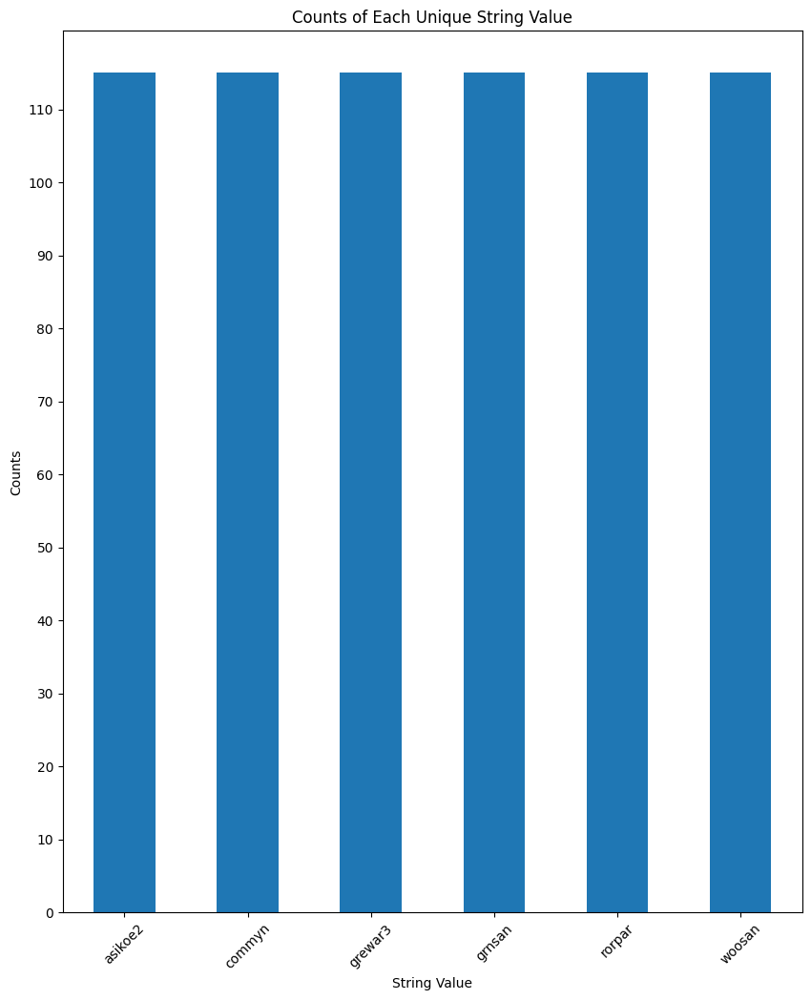

In [44]:
plot_count(aug_test_df, 'primary_label')

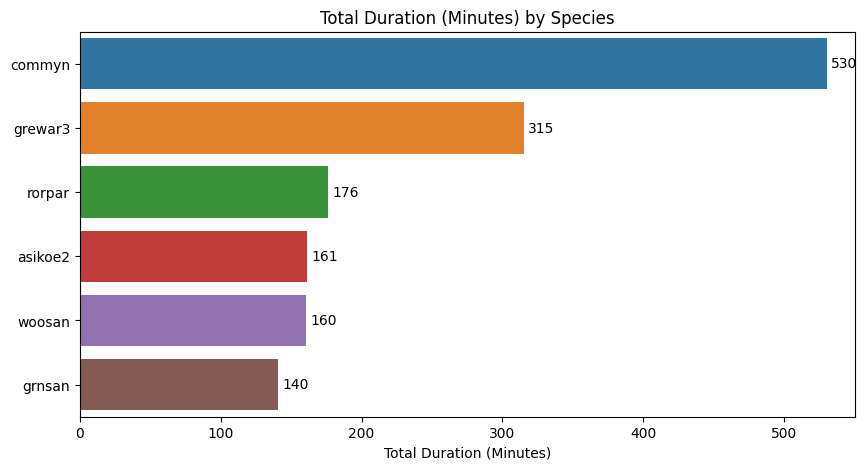

In [68]:
plot_duration_per_specie(aug_train_df, 10, 5)

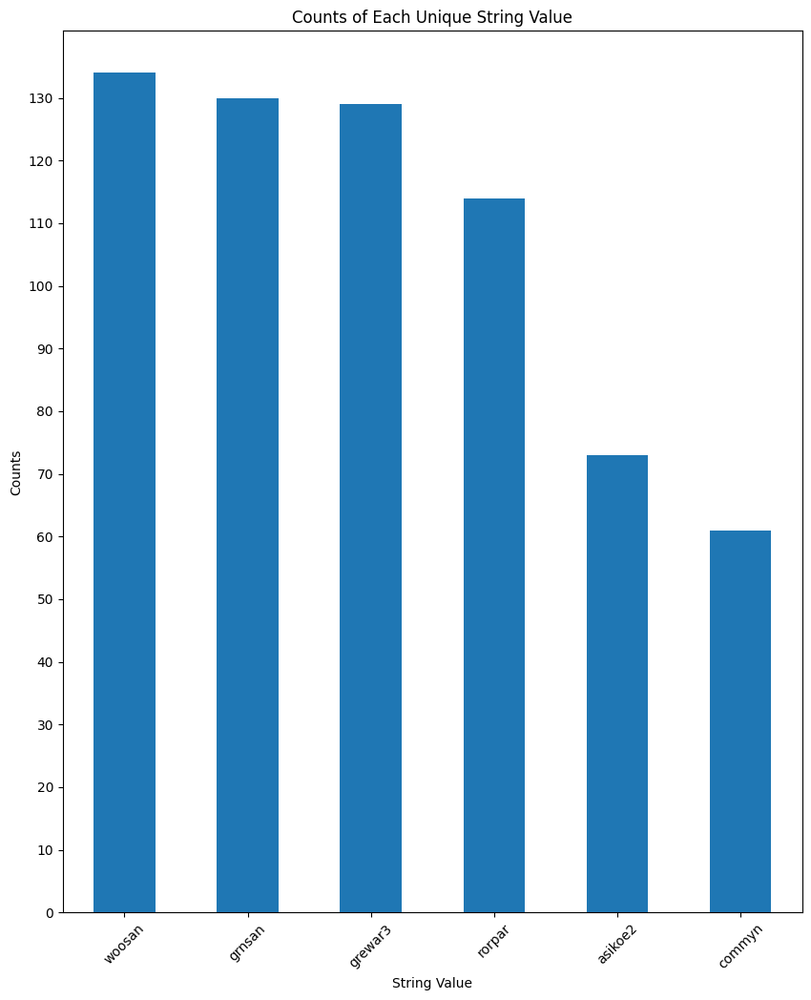

In [53]:
plot_count(test_df, 'primary_label')

In [ ]:
# for filename in train_df.head(20)['filename']:
#     audio = extract_audio(filename, sr=16000)
#     audio = pad_audio(audio, 16000*2.5)
#     print(audio)
#     assert audio.shape[0] % (16000*2.5) == 0, "The length of the padded array is not a multiple of 40000."

In [35]:
def save_audio_np(filenames, is_train):

    # create directory to save the extracted np array
    if is_train:
        folder_dir = '/kaggle/working/extracted/train_npy'
    else:
        folder_dir = '/kaggle/working/extracted/test_npy'

    os.makedirs(folder_dir, exist_ok=True)

    # list to store filepaths and files failed to be saved
    filepaths = []
    failed_filenames = []
    
    # loop over the filenames and extract the np objects and save to respective directory
    for i, filename in enumerate(filenames):

        # extract audio
        audio = extract_audio(filename)
        
#         # pad audio
#         audio = pad_audio(audio, 16000*2.5)

        # create new filepath
        folder = filename.split('/')[0]
        name = filename.split('/')[1]
        new_filename = name.replace('.ogg', '.npy')
        filepaths.append(f'{folder}/{new_filename}')

        # create save dir
        save_dir = f'{folder_dir}/{folder}/'

        if os.path.exists(save_dir):
            pass
        else:
            os.makedirs(save_dir, exist_ok=False)

        # create save filename
        save_filename = f'{save_dir}{new_filename}'

        #     # save .npy object
        #     with open(save_filename, 'w') as file:
        #       pass

        np.save(save_filename, audio)
        if not os.path.exists(save_filename):
            failed_filenames.append(save_filename)

#     assert all filenames have been looped through, and all files have been saved
    assert len(filenames) == len(filepaths)
    return filepaths, failed_filenames

In [ ]:
# example_train_df = train_df.tail(2)
# example_train_df = pd.concat([train_df[train_df['filename'] == 'greegr/XC338469.ogg'], train_df])['filename'] 
# example_train_df = train_df[train_df['filename'] == 'greegr/XC338469.ogg']['filename']
# example_train_df = train_df['filename']
# example_test_df = test_df['filename']
# example_train_df

In [36]:
train_filepaths, train_failed_filenames = save_audio_np(train_df['filename'], is_train=True)
test_filepaths, test_failed_filenames = save_audio_np(test_df['filename'], is_train=False)
train_df['filename_npy'] = train_filepaths
test_df['filename_npy'] = test_filepaths

In [37]:
print(len(train_filepaths), len(train_failed_filenames))
print(len(test_filepaths), len(test_failed_filenames))

1495 0
641 0


# **Merge Train/Val Dataframes Into One Dataframes with Set Column**

In [38]:
train_df['set'] = 'train'
test_df['set'] = 'val'
combined_df = pd.concat([train_df, test_df])

In [39]:
combined_df.to_csv('/kaggle/working/extracted/train_val.csv', index=False)

# **Model Data Prep**

## Self defined class methods to prepare framed audio data and extract audio features

In [40]:
class Framed:

    def __init__(self,
           dataframe,
           sr=16000,
           n_fft=2048,
           window_size_s=2.5,
           hop_size_s=2.5,
           do_augment=False
           ):
        """
        Instantiate the Framed class, create train and val dfs.

        The extract_framed() method is automatically called when the class is
        instantiated to extract the framed audios and add to the train and val dfs.

        Parameters:
          dataframe (pd.DataFrame): DataFrame containing audio file information.
          sr (int): Sample rate of the audio files.
          window_size_s (float): Window size in seconds for framing the audio.
          hop_size_s (float): Hop size in seconds for framing the audio.
          augment (bool): Whether to apply augmentation to the audio.
        """
        # instantiate class
        self.sr = sr
        self.n_fft=n_fft
        self.frame_length = int(window_size_s * sr)
        self.frame_step = int(hop_size_s * sr)

        # split the dataframe to train and val by calling the _split_train_val() method
        self.train_df, self.val_df = self._split_train_val(dataframe)

        # add framed audios to train and val dfs by calling the extract_framed() method
        # only training data could be augmented, validation is never augmented
        self.extract_framed(self.train_df, augment=do_augment, train_set = True)
        self.extract_framed(self.val_df, augment=False, train_set = False)


    ########################################
    # _split_train_val function is called when the class is instantiated
    ########################################
    def _split_train_val(self, dataframe):
        """
        Split the dataframe to train and val based on predefined 'set' column.

        Parameters:
          dataframe (pd.DataFrame): DataFrame containing audio file information.

        Returns:
          tuple: Tuple of train and val dataframes containing audio file information.
        """
        # extract the train set from dataframe & shuffle the train set
        train_df = dataframe[dataframe['set'] == 'train']
        train_df = train_df.sample(frac=1, random_state=1234)

        # extract the val set from dataframe & shuffle the val set
        val_df = dataframe[dataframe['set'] == 'val']
        val_df = val_df.sample(frac=1, random_state=1234)

        return train_df, val_df


    ########################################
    # augment function is called by extract_framed function if do_augment=True
    ########################################
#     def augment(self, audio_array):
#         audio_array = librosa.effects.pitch_shift(y=audio_array, sr=self.sr,
#                                                   n_steps=np.random.uniform(low=.970, high=1.03),
#                                                   n_fft=self.n_fft)
#         audio_array = librosa.effects.time_stretch(y=audio_array,
#                                                    rate=np.random.uniform(low=.975, high=1.025)) #n_fft=16384
#         noise_amp = np.random.normal(loc=0.0, scale=0.005)*np.amax(audio_array)
#         audio_array = audio_array + noise_amp*np.random.normal(size=audio_array.shape[0])
#         shift_range = int(np.random.uniform(low=-5, high=5)*160000)
#         audio_array = np.roll(audio_array, shift_range)
#         return audio_array
#     def augment(self, audio_array):
#         """
#         Apply random augmentation if needed.

#         Parameters:
#           audio_array (npy): Training audio array.

#         Returns:
#           audio_array (npy): Augmented audio array.
#         """
#         choice = np.random.choice(['noise','pitch']) #'original', 'shift',

#         # if the audio is short (less than 7 seconds in duration), stretch it first
#         if len(audio_array) <= 7*self.sr:
#             audio_array = librosa.effects.time_stretch(y=audio_array, rate=np.random.uniform(low=.8, high=1.2))
#         # if the audio is not short, apply a random augmentation at random magnitude
#         elif choice == 'noise':
#             noise_amp = np.random.normal(loc=0.0, scale=0.05)*np.amax(audio_array)
#             audio_array = audio_array + noise_amp*np.random.normal(size=audio_array.shape[0])
#         elif choice == 'shift':
#             shift_range = int(np.random.uniform(low=-5, high=5)*1000)
#             audio_array = np.roll(audio_array, shift_range)
#         elif choice == 'pitch':
#             audio_array = librosa.effects.pitch_shift(y=audio_array, sr=self.sr, n_steps=np.random.uniform(low=0, high=1))
#         else:
#             audio_array = audio_array

#         return audio_array


    ########################################
    # extract_framed function is called when the class is instantiated to extract the framed audios
    ########################################
    def extract_framed(self, dataframe, augment, train_set):
        """
        Load audio files from the given DataFrame, extract framed audios,
        and add the framed audios to the given DataFrame

        Parameters:
          dataframe (pd.DataFrame): DataFrame containing audio file information.
          augment (bool): Whether to apply augmentation to the audio.
        """
        if train_set: path = '/kaggle/input/extracted-npy/extracted/train_npy/'
        else: path = '/kaggle/input/extracted-npy/extracted/test_npy/'
        # load audios
        audios = []
#         audio = Parallel(n_jobs=os.cpu_count(), backend='loky')(delayed(self.load_npy)(path + filename, augment) for filename in tqdm(dataframe['filename_npy']))
#         audios.append(audio)
        for filename in dataframe['filename_npy']:
            audio = np.load(path + filename)
#             # if augment is true, call the augment function to apply augmentation to the audio
#             if augment:
#                 audio = self.augment(audio)
            audios.append(audio)
        assert len(audios) == len(dataframe)

        # extract framed audios
        framed = []
        for audio in audios:
            framed_audio = tf.signal.frame(audio, self.frame_length, self.frame_step, pad_end=False)
            framed.append(framed_audio)
        assert len(framed) == len(audios)

        # add framed audios to df
        dataframe['framed'] = framed
        
#     def load_npy(self, file_path, augment):
#         audio = np.load(file_path)
#         if augment:
#             audio = self.augment(audio)
#         return audio


In [41]:
class Extraction:

    def __init__(self,
           train_df,
           val_df,
           sr=16000,
           hop_length=625,
           n_fft=8192,
           n_mfccs=32, #20 is the default n_mfccs from librosa
           n_mels=32, #reduced from 128 default from librosa to 20
           n_chroma=16, #12 is the default n_chroma from librosa
           features=['mfcc'],
           do_normalize=True,
           do_avgpool=True #WARNING: THE KERNEL WILL CRASH IF YOU TRY TO EXTRACT ALL FEATURES WITHOUT AVGPOOL
           ):
        """
        Instantiate the Extraction class and extract the labels and features from train and val DataFrames.

        The extract_features() method is automatically called to extract the labels and features from the given DataFrame.

        Parameters:
          train_df (pd.DataFrame): DataFrame containing training data.
          val_df (pd.DataFrame): DataFrame containing validation data.
          sr (int): Sample rate of the audio files.
          n_mfccs (int): Number of MFCCs to extract.
          n_mels (int): Number of Mel bands to extract.
          n_chroma (int): Number of chroma bins to use.
          features (list): List of features to extract.
            accepted features: 'mfcc', 'chroma', 'rms', 'spectral_centroid', 'melspectrogram', 'continent', 'rating', 'type'.
          normalize (bool): Whether to normalize the features.
          maxpool (bool): Whether to maxpool the features.
        """
        # instantiate class variables
        self.sr = sr
        self.n_mfccs = n_mfccs
        self.n_mels = n_mels
        self.n_chroma = n_chroma
        self.do_normalize = do_normalize
        self.do_avgpool = do_avgpool
        self.hop_length = hop_length
        self.n_fft=n_fft

        # confirm features have been specified
        assert len(features) != 0, "Must Specify At Least One Feature In The Form Of A List."
        self.features = features

        # confirm features are valid
        self.accepted_feature = ['mfcc', 'chroma', 'rms', 'spectral_centroid', 'melspectrogram', 'continent', 'rating', 'type']
        for each in self.features:
            assert each in self.accepted_feature, f"{each} is not an accepted feature, only 'mfcc', 'chroma', 'rms', 'spectral_centroid', 'melspectrogram', 'continent', 'rating', and 'type' are accpeted features."

        # extract train and val labels and features
        self.train_y, self.train_features = self.extract_features(train_df)
        self.val_y, self.val_features = self.extract_features(val_df)

        # process the features by applying normalization or average pooling
        self.train_features, self.val_features = self.process_features(self.train_features, self.val_features)


    ########################################
    # each of the extract_x() function is callable by the extract_features() function based on the features instantiated
    # each of the features are extracted from librosa and transposed to shape (n_time, n_features)
    ########################################
    def extract_mfcc(self, each):
        return np.transpose(librosa.feature.mfcc(y=np.array(each), sr=self.sr, n_mfcc=self.n_mfccs,
                                                 hop_length=self.hop_length, n_fft=self.n_fft))

    def extract_chroma(self, each):
        return np.transpose(librosa.feature.chroma_stft(y=np.array(each), sr=self.sr, n_chroma=self.n_chroma,
                                                        hop_length=self.hop_length, n_fft=self.n_fft))

    def extract_rms(self, each):
        return np.transpose(librosa.feature.rms(y=np.array(each), hop_length=self.hop_length))

    def extract_spectral_centroid(self, each):
        return np.transpose(librosa.feature.spectral_centroid(y=np.array(each), sr=self.sr))

    def extract_melspectrogram(self, each):
        mel = librosa.feature.melspectrogram(y=np.array(each), sr=self.sr, n_mels=self.n_mels)
        return np.transpose(librosa.power_to_db(mel))


    ########################################
    # normalization function is called by process_features() function for the features that require normalization
    ########################################
    def normalization(self, train_X, val_X, n_time, n_features):
        """
        Normalize the train and val features

        Parameters:
          train_X (npy): Training feature
          val_X (npy): Validation feature
          n_time (int): Time axis
          n_features (int): Feature axis

        Returns:
          train_X (npy): Normalized training feature
          val_X (npy): Normalized validation feature
        """
        # flatten the np arrays to 1D
        train_X_reshape = train_X.reshape(-1, n_time * n_features)
        val_X_reshape = val_X.reshape(-1, n_time * n_features)

        # use minmaxscaler to normalize the train and val features
        scaler = MinMaxScaler((0,1)).fit(train_X_reshape)
        train_X_scaled = scaler.transform(train_X_reshape)
        val_X_scaled = scaler.transform(val_X_reshape)

        # reshape the features to the original shape (n_time, n_features)
        train_X = train_X_scaled.reshape(-1, n_time, n_features)
        val_X = val_X_scaled.reshape(-1, n_time, n_features)

        return train_X, val_X


    ########################################
    # avgpooling function is called by process_features() function for the features that require average pooling
    ########################################
    def avgpooling(self, train_X, val_X, n_time, n_features):
        """
        Average pooling the train and val features

        Parameters:
          train_X (npy): Training feature
          val_X (npy): Validation feature
          n_time (int): Time axis
          n_features (int): Feature axis

        Returns:
          train_X (npy): Avgpooled training feature
          val_X (npy): Avgpooled validation feature
        """
        # instantiate the keras layers and model.
        # the model only performs average pooling of inputs
        tf.keras.backend.clear_session()
        input = tf.keras.layers.Input(shape=(n_time, n_features))
        global_avg_pooling = tf.keras.layers.GlobalAveragePooling1D()
        pooled = global_avg_pooling(input)
        pooling_model = tf.keras.models.Model(inputs=input, outputs=pooled)

        # use the instantiated model to avgpool the train and val features
        train_X = pooling_model.predict(train_X)
        val_X = pooling_model.predict(val_X)

        return train_X, val_X


    ########################################
    # process_features function is called when the class is instantiated
    ########################################
    def process_features(self, train_features_dict, val_features_dict):
        """
        Apply normalization or average pooling to train and val features

        Parameters:
          train_features_dict (dict): Dictionary containing the training features
          val_features_dict (dict): Dictionary containing the validation features

        Returns:
          tuple: Tuple containing normalized and/or average pooled training and validation features dictionary
        """
        start_time = time.time()
        display('features processing started ---------->')
        for each in train_features_dict.keys():
            # 'continent', 'rating', and 'type' do not need to be processed
            if each == 'continent' or each == 'rating' or each == 'type':
                pass
            # process numeric features
            else:
                if each == 'mfcc':
                    n_features=self.n_mfccs
                elif each == 'chroma':
                    n_features=self.n_chroma
                elif each == 'rms' or each == 'spectral_centroid':
                    n_features=1
                elif each == 'melspectrogram':
                    n_features=self.n_mels

                # index the dictionary to find the value of the feature based on the feature name (key)
                train_feature = train_features_dict[each]
                val_feature = val_features_dict[each]

                # call normalization or avgpooling function to apply normalization or average pooling to features
                if self.do_normalize and self.do_avgpool:
                    train_features_dict[each], val_features_dict[each] = self.normalization(train_feature, val_feature, n_time=train_feature.shape[1], n_features=n_features)
                    train_features_dict[each], val_features_dict[each] = self.avgpooling(train_features_dict[each], val_features_dict[each], n_time=train_feature.shape[1], n_features=n_features)
                elif self.do_normalize:
                    train_features_dict[each], val_features_dict[each] = self.normalization(train_feature, val_feature, n_time=train_feature.shape[1], n_features=n_features)
                elif self.do_avgpool:
                    train_features_dict[each], val_features_dict[each] = self.avgpooling(train_feature, val_feature, n_time=train_feature.shape[1], n_features=n_features)
                else:
                    train_features_dict[each], val_features_dict[each] = train_features_dict[each], val_features_dict[each]

                display(f'{each} processed')

        end_time = time.time()
        display(f'features processing took {(end_time - start_time)/60:.1f} mins')

        return train_features_dict, val_features_dict


    ########################################
    # extract_features function is called when the class is instantiated
    ########################################
    def extract_features(self, dataframe):
        """
        Extract the label & features from the dataframes

        Parameters:
        dataframe (pd.DataFrame): DataFrame containing audio file information

        Returns:
        tuple: Tuple containing labels and a dictionary of extracted features
        """
        start_time = time.time()
        display(f'feature extraction started ---------->')

        # create empty list and dict to store the labels and features
        y = []
        features_dict = {item: [] for item in self.features}

        # iterate through each row of the dataframe to extract the label and features
        for _, row in dataframe.iterrows():
            label = row['primary_label']
            framed = row['framed']      

            for each in framed:
                y.append(label)

                if 'continent' in self.features:
                    features_dict['continent'].append(row['continent'])
                if 'rating' in self.features:
                    features_dict['rating'].append(row['rating'])
                if 'type' in self.features:
                    features_dict['type'].append(row['type'])

                # dynatically call the extract_x function to extract the listed features
                for feature in self.features: #4
                    extract = f"extract_{feature}"
                    if hasattr(self, extract) and callable(func := getattr(self, extract)):
                        features_dict[feature].append(func(each))

        # cast lists to np arrays
        for each in features_dict.keys():
            features_dict[each] = np.array(features_dict[each])
        y = np.array(y)

        end_time = time.time()
        display(f'features extraction took {(end_time - start_time)/60:.1f} mins')

        return y, features_dict

In [ ]:
df = pd.read_csv('/kaggle/input/extracted-npy-demo/extracted/train_val.csv')
# example_df = pd.concat([df.head(5), df.tail(5)])

# example_df_train = example_df[example_df["set"] == "train"]
# example_df_train
# display(example_df)

# Filter the row with the greatest duration
display(df.loc[df['duration'].idxmax()])
display(df.head(5))

In [258]:
def extract_framed(dataframe, augment, train_set):
    """
    Load audio files from the given DataFrame, extract framed audios,
    and add the framed audios to the given DataFrame

    Parameters:
      dataframe (pd.DataFrame): DataFrame containing audio file information.
      augment (bool): Whether to apply augmentation to the audio.
    """
    if train_set: path = '/kaggle/input/extracted-npy-demo/extracted/train_npy/'
    else: path = '/kaggle/input/extracted-npy-demo/extracted/test_npy/'
    # load audios
    audios = []
#         audio = Parallel(n_jobs=os.cpu_count(), backend='loky')(delayed(self.load_npy)(path + filename, augment) for filename in tqdm(dataframe['filename_npy']))
#         audios.append(audio)
    for filename in dataframe['filename_npy']:
        audio = np.load(path + filename)
        audios.append(audio)
        # if augment is true, call the augment function to apply augmentation to the audio
        if augment:
            Audio(audio, rate=16000)
            audio = augment_fun(audio)
#             print(type(audio))
#             Audio(audio, rate=16000)
        audios.append(audio)
    return audios
        
# for audio_array in audios:
def augment_fun(audio_array):
#     choice = np.random.choice(['original','noise','pitch']) #,'shift'

#         # if the audio is short (less than 7 seconds in duration), stretch it first
#     if len(audio_array) <= 7*self.sr:
    audio_array = librosa.effects.pitch_shift(y=audio_array, sr=16000, n_steps=np.random.uniform(low=.970, high=1.03), n_fft=2048)
    audio_array = librosa.effects.time_stretch(y=audio_array, rate=np.random.uniform(low=.975, high=1.025)) #n_fft=16384
#     elif choice == 'noise':
    noise_amp = np.random.normal(loc=0.0, scale=0.005)*np.amax(audio_array)
    audio_array = audio_array + noise_amp*np.random.normal(size=audio_array.shape[0])
#     elif choice == 'shift':
    shift_range = int(np.random.uniform(low=-5, high=5)*160000)
    audio_array = np.roll(audio_array, shift_range)
#     elif choice == 'pitch':
    
#     else:
#         audio_array = audio_array
    return audio_array

audios = extract_framed(df[df['set']=='train'].head(40), True, True)

In [262]:
Audio(audios[7], rate=16000)

In [13]:
for i in range(10):
#     print(np.random.uniform(low=0.8, high=1.2))
    print(np.random.normal(loc=0.0, scale=0.05))

0.10037381985186662
-0.06578752264178896
0.0191409876158653
0.05313081258564467
0.1016973741218557
0.03490338624707028
-0.00748642957373245
0.06537516787564338
-0.07649670176876057
-0.041468388844100354


In [ ]:
# result = []
# path = '/kaggle/input/birdclef-2024/train_audio/' #'/kaggle/working/extracted/train_npy/greegr/'
# filename = 'greegr/XC338469.ogg'
# df_test_working = pd.read_csv('/kaggle/input/birdclef-2024/train_metadata.csv')
# display(df_test_working.head(2))
directory = "/kaggle/input/birdclef-2024/"
filename = 'eBird_Taxonomy_v2021.csv'
# for root, dirs, files in os.walk(path):
#     if filename in files:
#         result.append(os.path.join(root, filename))
# print(os.path.join(directory, filename))
# print("/kaggle/input/birdclef-2024/eBird_Taxonomy_v2021.csv")
result = os.path.isfile('/kaggle/input/extracted-npy/extracted/test_npy/commoo3/XC814114.npy')
print(result)

In [ ]:
%%time

framed = Framed(df, #df_example,
                window_size_s=2..5,
                hop_size_s=2.5,
#                 hop_size_s=2.5,
                do_augment=True)

In [ ]:
# framed.train_df = framed.train_df[framed.train_df['filename']!='brodro1/XC625550.ogg']
framed.train_df[framed.train_df['filename']=='commoo3/XC784988.ogg'].iloc[0]['framed'].shape
# framed.train_df.iloc[0]['framed']
# framed.train_df.head()

In [ ]:
# features_list = ['mfcc', 'chroma', 'rms', 'spectral_centroid', 'melspectrogram', 'continent', 'type', 'rating']
features_list = ['mfcc', 'chroma', 'rms']

In [ ]:
%%time

features = Extraction(framed.train_df,
                      framed.val_df,
                      features=features_list,
                      do_normalize=True,
                      do_avgpool=True)